In [1]:
#explore the t cells
import scanpy as sc #for scanpy >= 1.3.7
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import logging
import os
import glob
import matplotlib
import math

In [2]:
def pca_elbow(adata, n_genes, n_pca_pcs, name):
    rcParams['figure.figsize']=(8,8)
    rcParams['font.size']=16
    
    sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=n_genes)
    sc.pp.pca(adata, n_comps=n_pca_pcs, use_highly_variable=True, svd_solver='arpack')
    sc.pl.pca_variance_ratio(adata, log=False, save = '_{}.png'.format(name))
    
def removegenes(adata):
    """remove human HLA genes from the dataset 
    Parameters:
    ----------
    adata: scanpy.adata
        scanpy adata object

    Returns:
    -------
    temp: scanpy.adata
        scanpy adata object
    """
    IGKV = [x for x in adata.var_names if x.startswith('IGKV')]
    IGHV = [x for x in adata.var_names if x.startswith('IGHV')]
    IGLV = [x for x in adata.var_names if x.startswith('IGLV')]
    IGLC = [x for x in adata.var_names if x.startswith('IGLC')]
    IGLL = [x for x in adata.var_names if x.startswith('IGLL')]
    IGKC = [x for x in adata.var_names if x.startswith('IGKC')]
    IGHC = [x for x in adata.var_names if x.startswith('IGHC')]
    TRAV = [x for x in adata.var_names if x.startswith('TRAV')]
    TRBV = [x for x in adata.var_names if x.startswith('TRBV')]
    
    exclude = IGKV + IGHV + IGLV + IGKC + IGHC + IGLL + IGLC+TRAV + TRBV 
    gene = [x for x in adata.var_names if x not in exclude]
    temp = adata[:,gene].copy()
    return(temp)
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score


def sil_cal(adata, res_list, n_knn_pcs):
    key_list = []
    for res in res_list:
        key_list.append('res_{}'.format(res))
        sc.tl.leiden(adata, resolution=res, key_added = 'res_{}'.format(res))
        
    pca_matrix = adata.obsm['X_pca'][:,0:n_knn_pcs]
    sil_df = pd.DataFrame(index = adata.obs.index, columns = key_list)
    info_df = pd.DataFrame(index = key_list, columns = ['n_clusters', 'sil_avg', 'res'])
    
    info_df['res'] = res_list
    
    for res_name in key_list:
        
        labels = adata.obs[res_name].to_numpy(dtype = int)
        n_clusters = len(adata.obs[res_name].unique())
        
        info_df.loc[res_name, 'n_clusters'] = n_clusters
        
        if labels.sum() == 0:
            print('At resolution {} only 1 cluster is defined, skip to the next resolution'.format(res_name.split('_')[1]))
            sil_df[res_name] = 0
            info_df.loc[res_name, 'sil_avg'] = 0
            continue
        else:
            silhouette_avg = silhouette_score(pca_matrix, adata.obs[res_name].to_numpy(dtype = int))
            sample_silhouette_values = silhouette_samples(pca_matrix, adata.obs[res_name].to_numpy(dtype = int))
            sil_df[res_name] = sample_silhouette_values
            info_df.loc[res_name, 'sil_avg'] = silhouette_avg
            print('At resolution {} the average silhouette score is {}'.format(res_name.split('_')[1], silhouette_avg))
            
    return(sil_df, info_df)

def summary_plot(info_df, path, name):
    temp_df = info_df.loc[info_df.sil_avg != 0]
    
    rcParams['figure.figsize']=(20,10)
    rcParams['font.size']=22
    fig, (ax1, ax2) = plt.subplots(1, 2)
    sb.scatterplot(data = temp_df, x = 'res', y = 'sil_avg',s =200, 
                   alpha = 0.5, color = 'black', edgecolor = 'k', ax = ax1)
    sb.scatterplot(data = temp_df, x = 'n_clusters', y = 'sil_avg',s =200, alpha = 0.5, 
                   color = 'black', edgecolor = 'k', ax = ax2)
    
    ax1.set_xlabel("Resolution")
    ax1.set_ylabel("Average silhouette score")
    ax2.set_xlabel("Cluster numbers")
    ax2.set_ylabel("Average silhouette score")

    save_dir = os.path.join(path, name)
    fig.savefig(save_dir, bbox_inches='tight')
#   plt.close()



In [3]:
adata_savepath = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/processed_data/annotated.h5ad'
adata= sc.read_h5ad(adata_savepath)

In [4]:
list(adata.obs.GeneralAnnotation.unique())

['CD3+',
 'NK',
 'Doublets',
 'Proliferating',
 'Macrophage',
 'B-cell',
 'unknown',
 'Plasma',
 'DC',
 'LSECs',
 'Monocyte',
 'Platelets']

In [5]:
adata_high = adata[adata.obs.cell_quality == 'high'].copy()

In [6]:
adata_high

AnnData object with n_obs × n_vars = 288764 × 36601
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'total_counts_mt', 'pct_counts_mt', 'cell_quality', 'FinalAnnotation', 'SecondAnnotation', 'GeneralAnnotation', 'patient_id', 'tissue', 'Gender', 'Group', 'Age (years)', 'Time since HBV diagnosis (years)', 'HBsAg (COI)', 'HBsAb (IU/L)', 'HBeAg (COI)', 'HBeAb (COI)', 'HBcAb (COI)', 'HBsAg level (IU/ml)', 'HBV DNA level (log10 IU/ml)', 'ALT (U/L)', 'AST (U/L)', 'Stage'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [7]:
adata_t = adata_high[adata_high.obs.GeneralAnnotation == 'CD3+'].copy()

In [8]:
adata_t.obs.groupby('SecondAnnotation').size()

SecondAnnotation
CD3+     6812
CD4+    86020
CD8+    75310
dtype: int64

In [9]:
ind_CD8 = adata_t.obs.loc[(adata_t.obs.SecondAnnotation == 'CD8+') | 
                          (adata_t.obs.FinalAnnotation == 'CD8+TEffector') |
                          (adata_t.obs.FinalAnnotation == 'CD8+TCentralMemory')].index
                          

In [10]:
len(ind_CD8)

96812

In [13]:
adata_CD8 = adata_t[ind_CD8,:].copy()

In [14]:
adata_CD8

AnnData object with n_obs × n_vars = 96812 × 36601
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'total_counts_mt', 'pct_counts_mt', 'cell_quality', 'FinalAnnotation', 'SecondAnnotation', 'GeneralAnnotation', 'patient_id', 'tissue', 'Gender', 'Group', 'Age (years)', 'Time since HBV diagnosis (years)', 'HBsAg (COI)', 'HBsAb (IU/L)', 'HBeAg (COI)', 'HBeAb (COI)', 'HBcAb (COI)', 'HBsAg level (IU/ml)', 'HBV DNA level (log10 IU/ml)', 'ALT (U/L)', 'AST (U/L)', 'Stage'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [15]:
adata_CD8.obs.groupby('FinalAnnotation').size()

FinalAnnotation
CD8+EffectorMemory     2330
CD8+Naive              9262
CD8+TCentralMemory     6510
CD8+TEffector         36617
CD8+Texhausted        25507
MAIT                  16586
dtype: int64

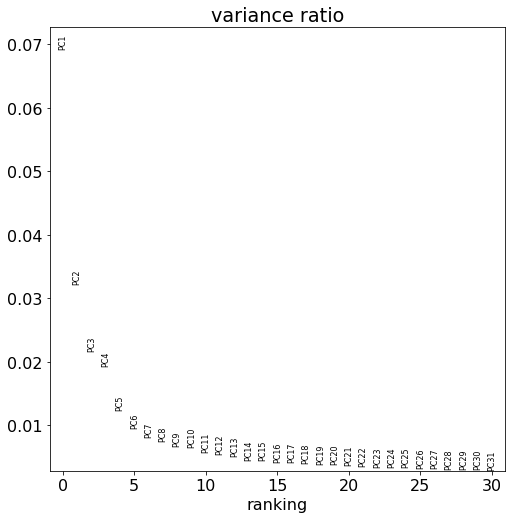

At resolution 0.1 the average silhouette score is 0.22496262192726135
At resolution 0.2 the average silhouette score is 0.20405220985412598
At resolution 0.3 the average silhouette score is 0.2253788858652115
At resolution 0.4 the average silhouette score is 0.19519272446632385
At resolution 0.6 the average silhouette score is 0.19427144527435303
At resolution 0.8 the average silhouette score is 0.18309949338436127
At resolution 1 the average silhouette score is 0.11728869378566742
At resolution 1.5 the average silhouette score is 0.08723974972963333


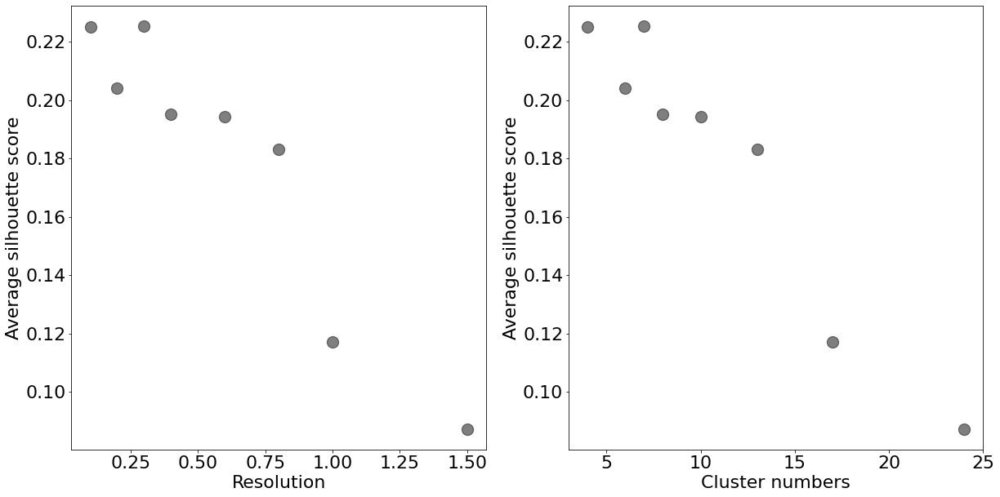

In [16]:
#let's do a quick cluster on CD8 cells
adata_CD8 = removegenes(adata_CD8)
sc.pp.filter_genes(adata_CD8,min_cells=3)
sc.pp.normalize_total(adata_CD8, target_sum=1e4)
sc.pp.log1p(adata_CD8)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
pca_elbow(adata_CD8, 2000, 50, 'CD8')
sc.external.pp.bbknn(adata_CD8, batch_key='tissue', neighbors_within_batch=10, n_pcs=10)
res_list = [0.1, 0.2, 0.3, 0.4, 0.6, 0.8, 1, 1.5]
temp_adata = adata_CD8.copy()
test_df, info_df = sil_cal(temp_adata, res_list, n_knn_pcs = 10)
figpath = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
summary_plot(info_df, figpath, 'sil_summary_CD8.png')


In [17]:
#try resolution 0.8
adata_CD8.obs['leiden_r0.8'] = temp_adata.obs['res_0.8']
sc.tl.umap(adata_CD8)

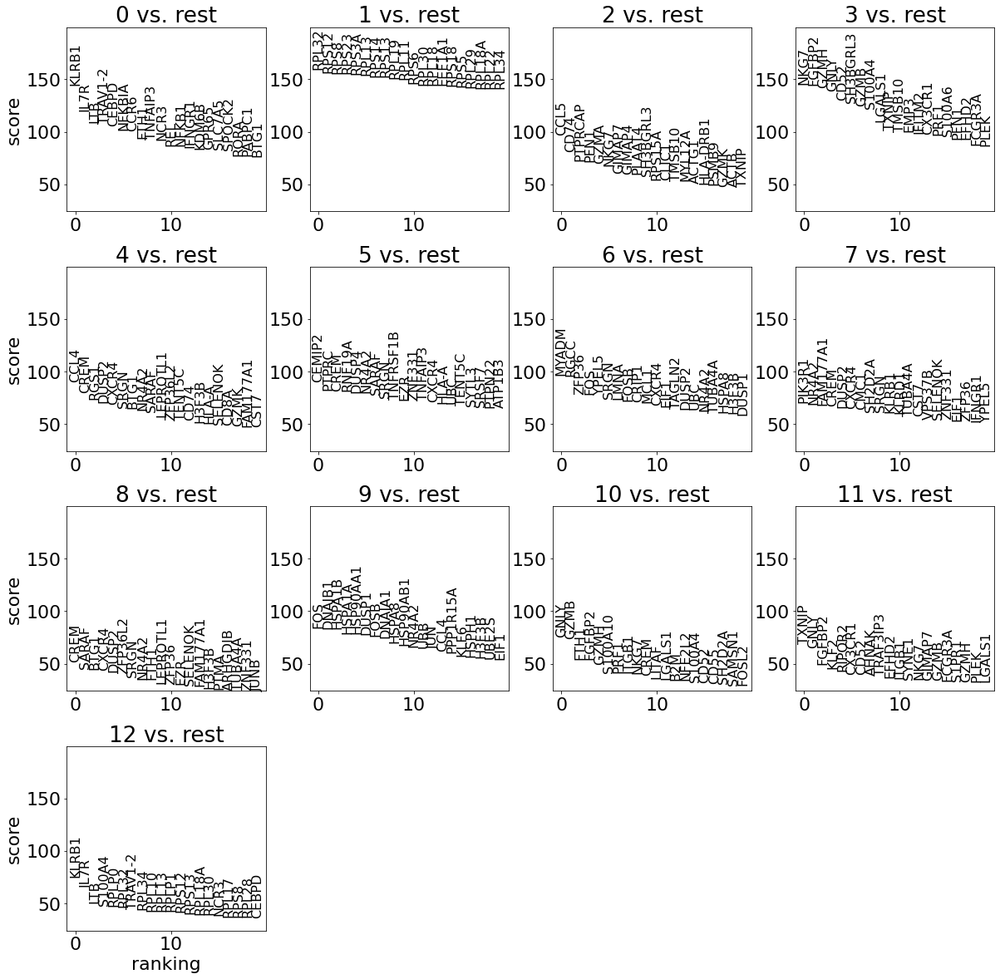

In [18]:
sc.tl.rank_genes_groups(adata_CD8, groupby='leiden_r0.8', key_added='rank_genes_r0.8', 
                        use_raw = False, method = 'wilcoxon')
rcParams['figure.figsize']=(5,5)
sc.pl.rank_genes_groups(adata_CD8, key='rank_genes_r0.8', fontsize=16, use_raw = False)

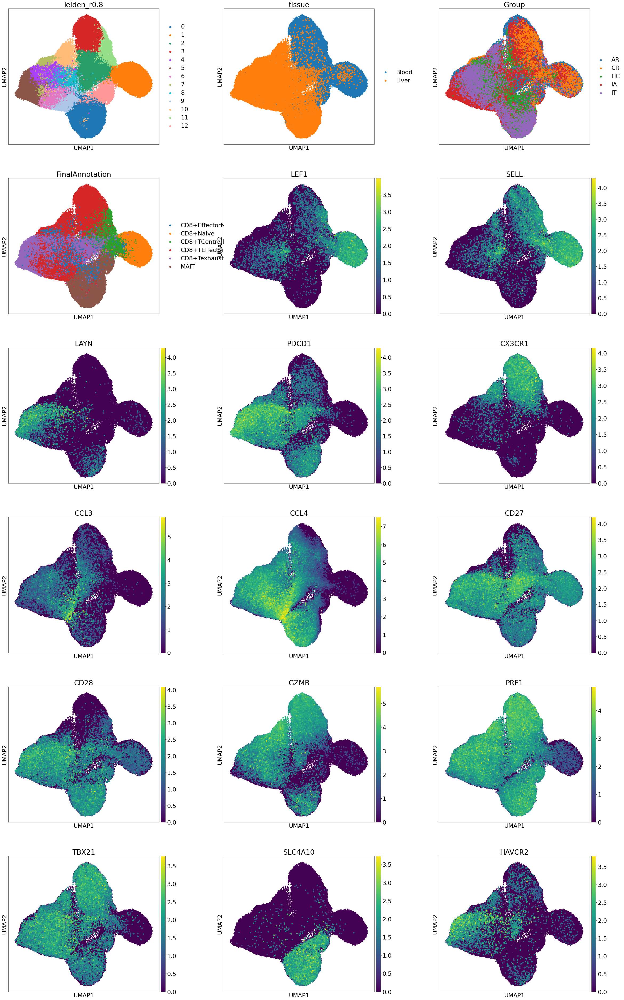

In [20]:
rcParams['figure.figsize']=(10,10)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['leiden_r0.8', 'tissue', 'Group',
                            'FinalAnnotation', 'LEF1', 'SELL', 'LAYN', 'PDCD1','CX3CR1', 'CCL3', 'CCL4','CD27','CD28',
                             'GZMB', 'PRF1', 'TBX21', 'SLC4A10', 'HAVCR2'], wspace = 0.3, 
           s =100, ncols = 3, use_raw = False, save = 'leidenr0.8')



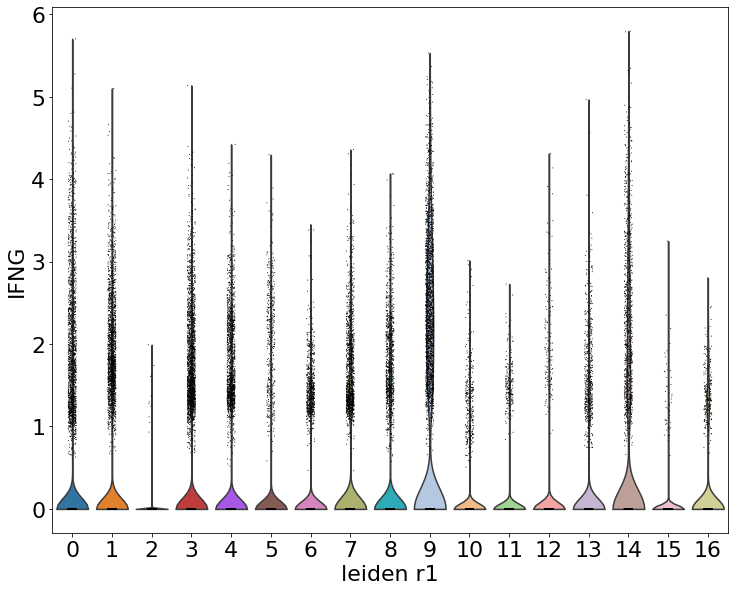

In [37]:
sc.pl.violin(adata_CD8, keys = ['IFNG'], groupby = 'leiden_r1')

In [30]:
#try resolution 0.8
adata_CD8.obs['leiden_r1'] = temp_adata.obs['res_1']
sc.tl.umap(adata_CD8)

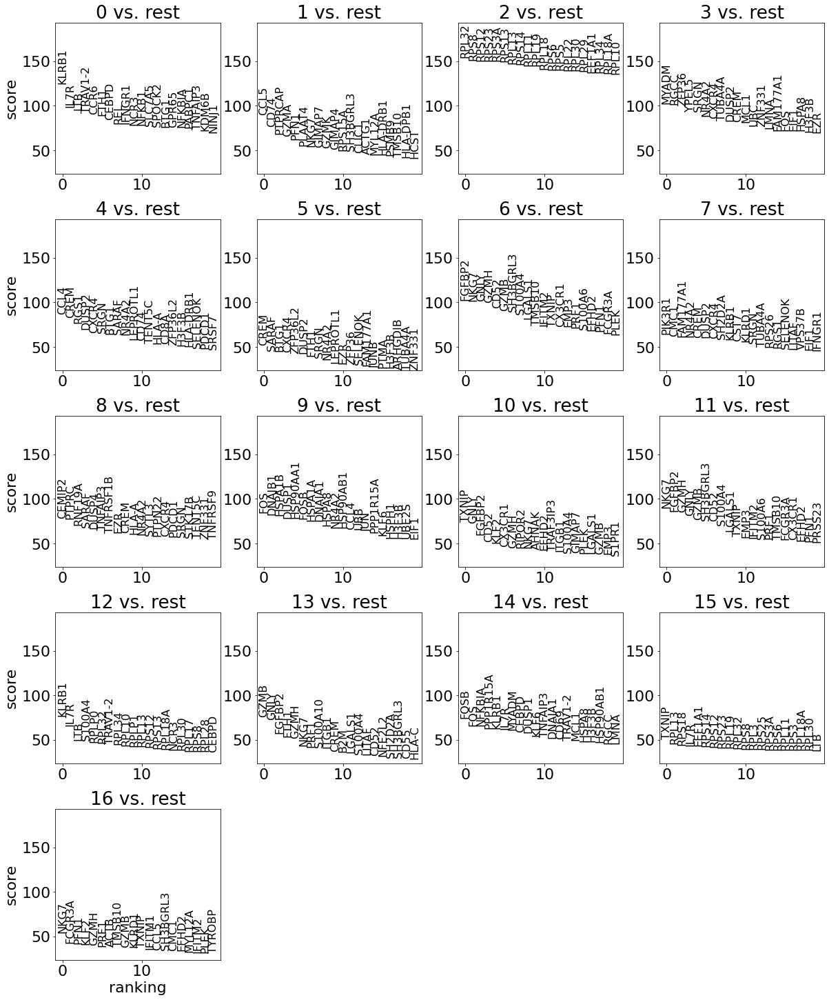

In [31]:
sc.tl.rank_genes_groups(adata_CD8, groupby='leiden_r1', key_added='rank_genes_r1', 
                        use_raw = False, method = 'wilcoxon')
rcParams['figure.figsize']=(5,5)
sc.pl.rank_genes_groups(adata_CD8, key='rank_genes_r1', fontsize=16, use_raw = False)

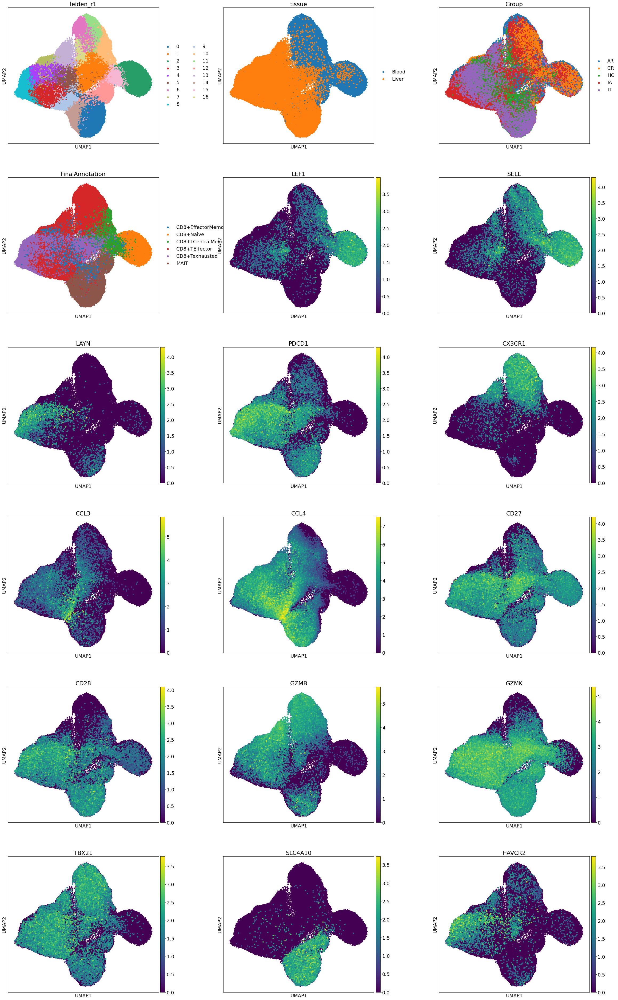

In [40]:
rcParams['figure.figsize']=(10,10)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['leiden_r1', 'tissue', 'Group',
                            'FinalAnnotation', 'LEF1', 'SELL', 'LAYN', 'PDCD1','CX3CR1', 'CCL3', 'CCL4','CD27','CD28',
                             'GZMB', 'GZMK', 'TBX21', 'SLC4A10', 'HAVCR2'], wspace = 0.3, 
           s =100, ncols = 3, use_raw = False, save = 'leidenr1')

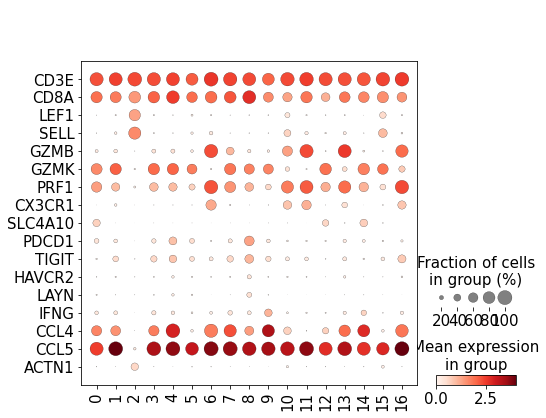

In [39]:
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'

marker_genes = ['CD3E', 'CD8A','LEF1', 'SELL', 'GZMB', 'GZMK', 'PRF1', 'CX3CR1', 'SLC4A10',
                'PDCD1', 'TIGIT', 'HAVCR2', 'LAYN', 'IFNG', 'CCL4', 'CCL5', 'ACTN1']

rcParams['font.size']=18
sc.pl.dotplot(adata_CD8, marker_genes, groupby='leiden_r1', use_raw=False, swap_axes = True, save = 'dotplot.png')

In [ ]:
#Let's annotate the CD8 based on the leidenr1

In [3]:
adata_CD8.obs.drop(columns='subtype', inplace = True)

In [4]:
adata_CD8.obs['subtype'] = adata_CD8.obs['leiden_r1'].cat.add_categories(['CD8+ Naive',
                                                                         'CD8+ Temra/Teff',
                                                                         'CD8+ MAIT',
                                                                         'CD8+ Tem',
                                                                         'CD8+ Tcm',
                                                                         'CD8+ Tex'])

adata_CD8.obs['subtype'][np.in1d(adata_CD8.obs['leiden_r1'], ['2'])] = 'CD8+ Naive'
adata_CD8.obs['subtype'][np.in1d(adata_CD8.obs['leiden_r1'], ['6', '7', '10', '11','13', '16'])] = 'CD8+ Temra/Teff'
adata_CD8.obs['subtype'][np.in1d(adata_CD8.obs['leiden_r1'], ['0', '12','14'])] = 'CD8+ MAIT'
adata_CD8.obs['subtype'][np.in1d(adata_CD8.obs['leiden_r1'], ['1','3','4','5','9'])] = 'CD8+ Tem'
adata_CD8.obs['subtype'][np.in1d(adata_CD8.obs['leiden_r1'], ['15'])] = 'CD8+ Tcm'
adata_CD8.obs['subtype'][np.in1d(adata_CD8.obs['leiden_r1'], ['8'])] = 'CD8+ Tex'


adata_CD8.obs['subtype'] = adata_CD8.obs['subtype'].cat.remove_unused_categories()




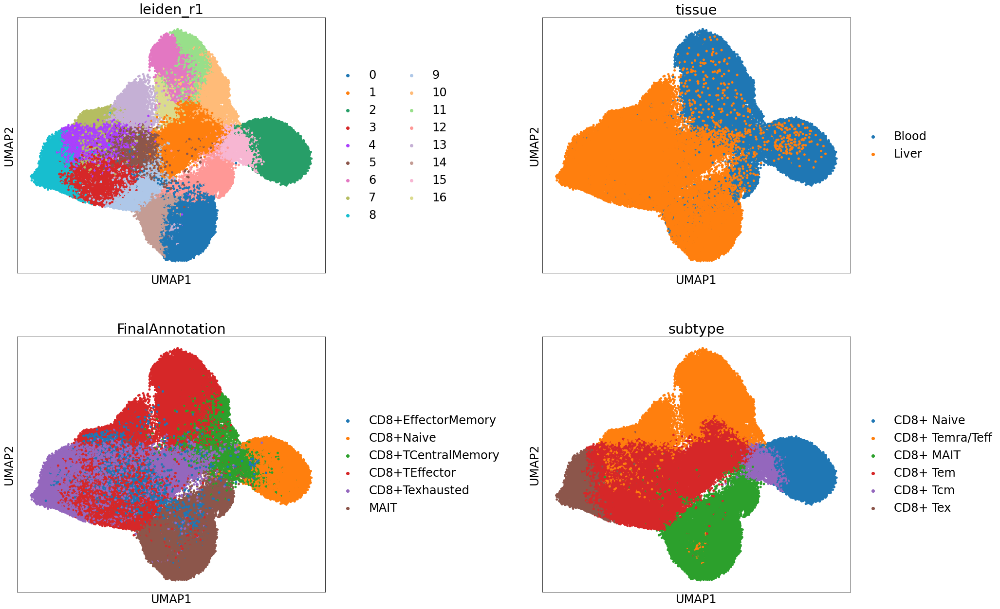

In [3]:
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
rcParams['figure.figsize']=(10,10)
rcParams['font.size']=24
sc.pl.umap(adata_CD8, color=['leiden_r1',
                             'tissue',
                           'FinalAnnotation',
                           'subtype'], 
s =100, ncols =2, wspace = 0.55, save = '_t_final.png', use_raw = False)

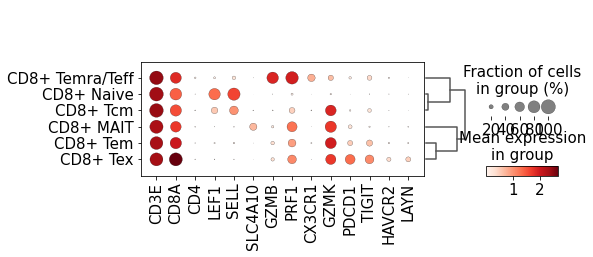

In [6]:
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'

marker_genes = ['CD3E', 'CD8A', 'CD4', 'LEF1', 'SELL', 'SLC4A10', 'GZMB', 'PRF1', 'CX3CR1', 'GZMK',
                'PDCD1', 'TIGIT', 'HAVCR2', 'LAYN']
rcParams['figure.figsize']=(5,15)
rcParams['font.size']=18
sc.pl.dotplot(adata_CD8, marker_genes, groupby='subtype', 
              use_raw=False, swap_axes = False, save = '_final_dotplot.png', dendrogram=True)




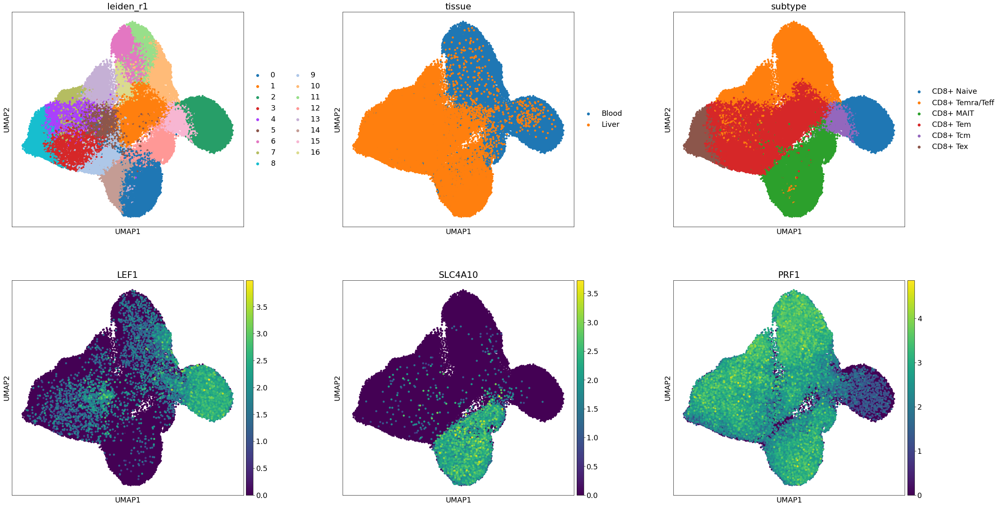

In [7]:
rcParams['figure.figsize']=(10,10)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['leiden_r1', 'tissue', 'subtype', 'LEF1', 'SLC4A10', 'PRF1'], wspace = 0.3, 
           s =100, ncols = 3, use_raw = False, save = 'naive.png')

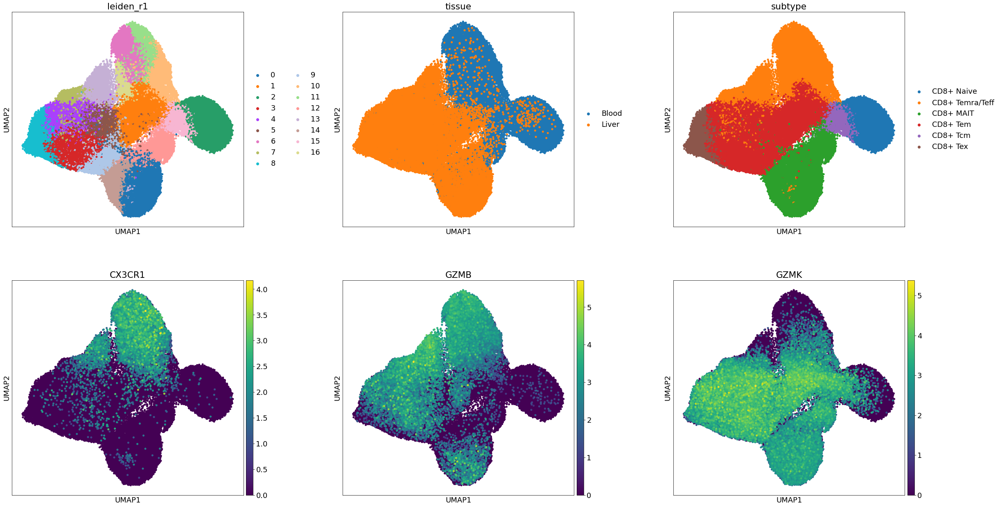

In [8]:
rcParams['figure.figsize']=(10,10)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['leiden_r1', 'tissue', 'subtype','CX3CR1', 'GZMB', 'GZMK'], wspace = 0.3, 
           s =100, ncols = 3, use_raw = False, save = 'GZM.png')

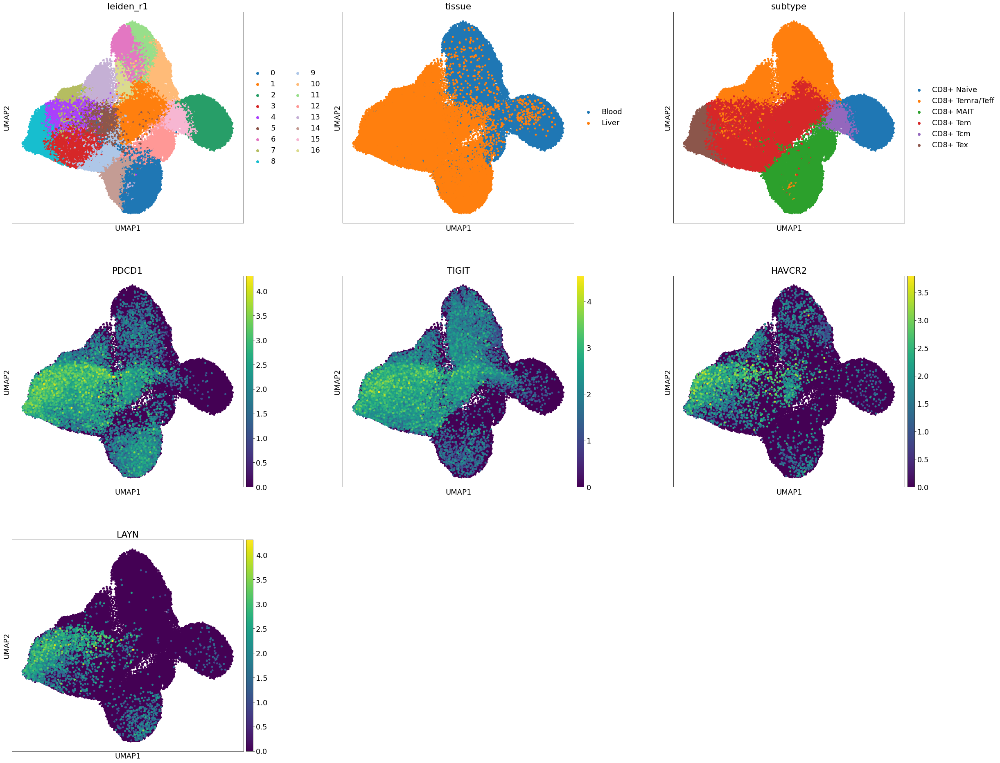

In [9]:
rcParams['figure.figsize']=(10,10)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['leiden_r1', 'tissue', 'subtype', 'PDCD1', 'TIGIT', 'HAVCR2', 'LAYN'], wspace = 0.3, 
           s =100, ncols = 3, use_raw = False, save = 'exh.png')

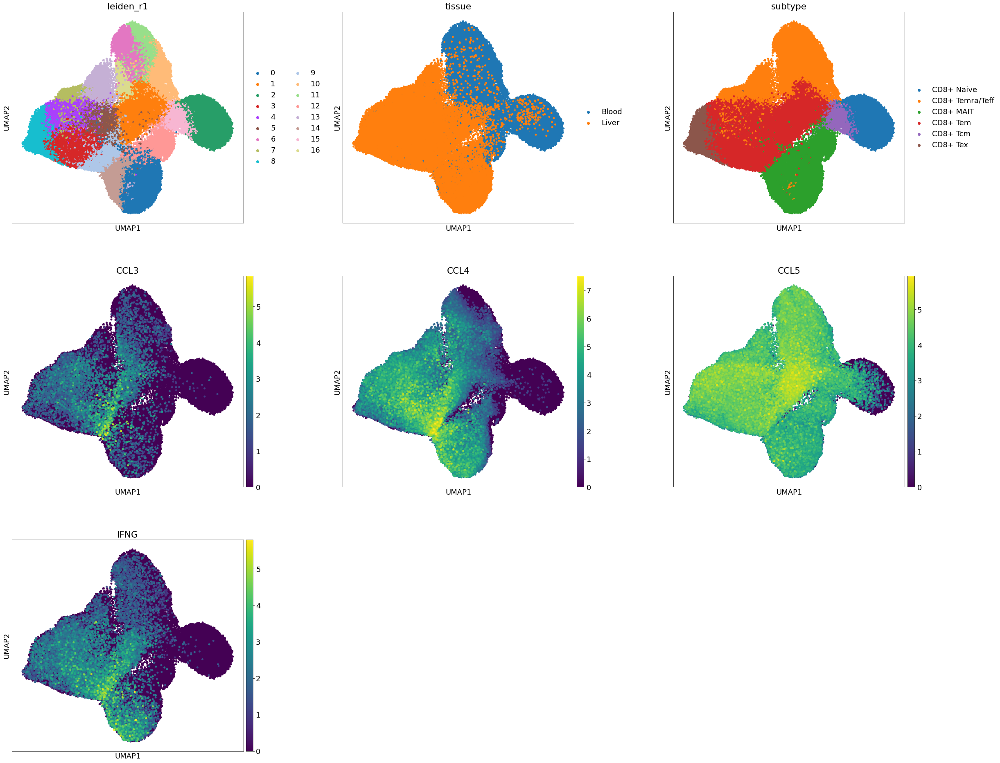

In [10]:
rcParams['figure.figsize']=(10,10)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['leiden_r1', 'tissue', 'subtype','CCL3', 'CCL4', 'CCL5', 'IFNG'], wspace = 0.3, 
           s =100, ncols = 3, use_raw = False, save = 'ccl.png')

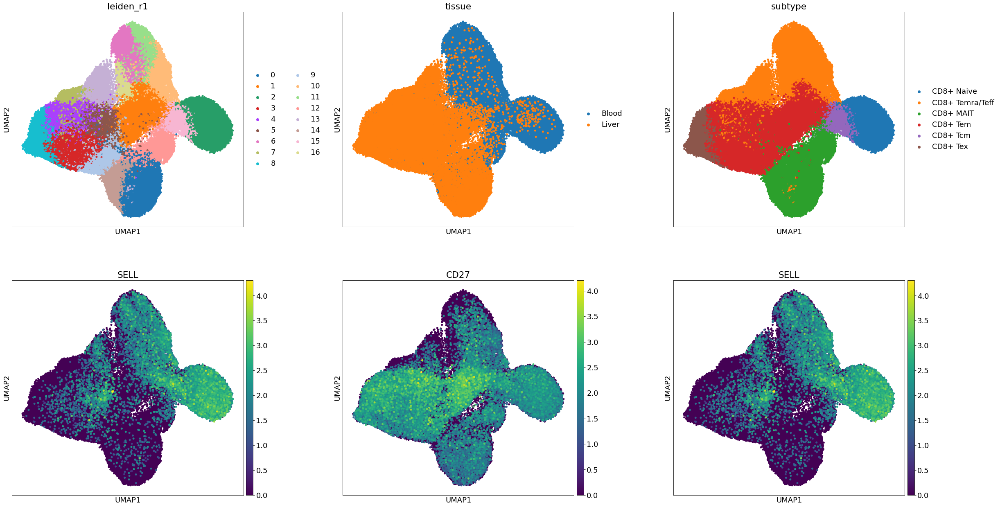

In [11]:
rcParams['figure.figsize']=(10,10)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['leiden_r1', 'tissue', 'subtype','SELL', 'CD27', 'SELL'], wspace = 0.3, 
           s =100, ncols = 3, use_raw = False, save = 'cm.png')

In [12]:
savepath = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/processed_data/CD8.h5ad'
adata_CD8.write(savepath)

In [2]:
savepath = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/processed_data/CD8.h5ad'
adata_CD8 = sc.read_h5ad(savepath)

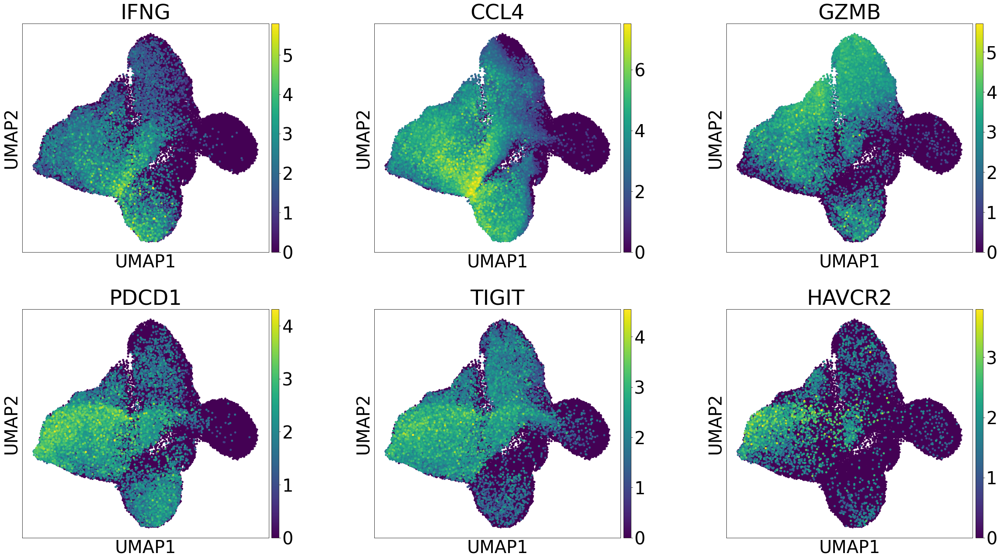

In [5]:
rcParams['figure.figsize']=(10,10)
rcParams['font.size']=40
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['IFNG', 'CCL4', 'GZMB','PDCD1', 'TIGIT', 'HAVCR2'], wspace = 0.3, 
           s =100, ncols = 3, use_raw = False, save = 'for_pre.png')

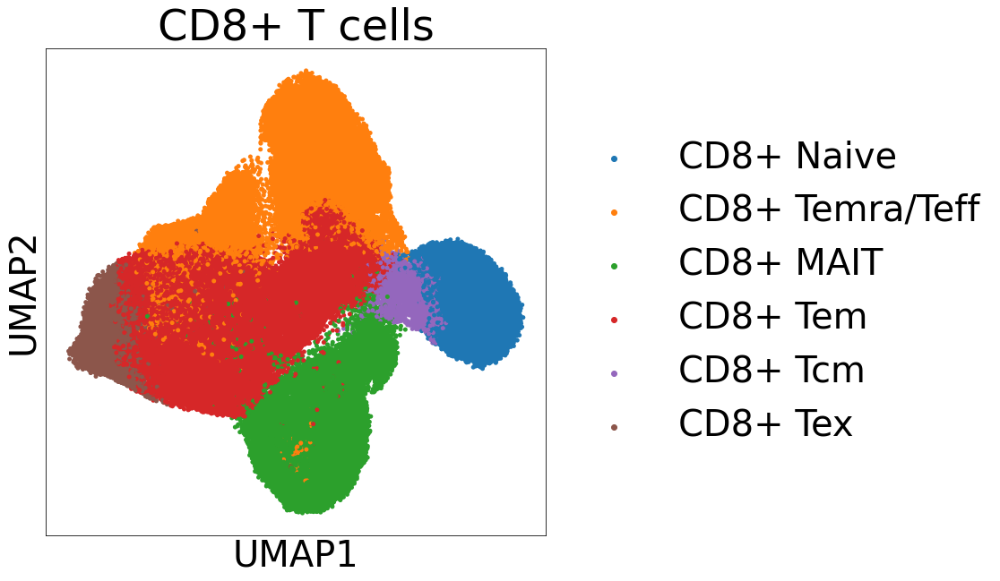

In [7]:
rcParams['figure.figsize']=(10,10)
rcParams['font.size']=40
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/T_cells/CD8/'
sc.pl.umap(adata_CD8, color=['subtype'], wspace = 0.3, title = 'CD8+ T cells', 
           s =100, ncols = 1, use_raw = False, save = 'for_pre_2.png')

In [4]:
#load source metadata
#load metadata from the authors from the gut paper
src_data_path = '/domino/edv/id-td-virology/Zhiyuan/public/Gut/processed_data/Gut2022_ttlsc_annotations.csv'
src_meta = pd.read_csv(src_data_path,index_col = 0)

In [5]:
len(src_meta.loc[src_meta.majorCluster == 'CD8_T'])

85822

In [6]:
len(adata_CD8.obs.index)

96812

In [10]:
ind_meta = src_meta.loc[src_meta.majorCluster == 'CD8_T'].index

In [11]:
ol = [x for x in ind_meta if x in adata_CD8.obs.index]

In [12]:
len(ol)

74933

In [13]:
test = adata_CD8[ol]

In [14]:
src_meta_2 = src_meta.loc[ol]

In [15]:
df = src_meta_2[['batch', 'patientID', 'tissue', 'stage', 'majorCluster','subCluster']].copy()

In [16]:
df.loc[ol,'GeneralAnnotation'] = adata_CD8.obs.loc[ol, 'GeneralAnnotation']
df.loc[ol,'FinalAnnotation'] = adata_CD8.obs.loc[ol, 'FinalAnnotation']
df.loc[ol,'subtype'] = adata_CD8.obs.loc[ol, 'subtype']
df.loc[ol,'SecondAnnotation'] = adata_CD8.obs.loc[ol, 'SecondAnnotation']

In [17]:
df_2 = df.groupby(['subCluster', 'subtype'], observed = True).size().unstack()

In [18]:
ind = [x for x in df_2.index if x.startswith('CD8')]
df_3 = df_2.loc[ind].copy().fillna(0)

In [19]:
df_3

subtype,CD8+ Temra/Teff,CD8+ Naive,CD8+ Tem,CD8+ MAIT,CD8+ Tcm,CD8+ Tex
subCluster,,,,,,
CD8T_c01-LEF1,15.0,8523.0,13.0,13.0,244.0,0.0
CD8T_c02-SELL,361.0,440.0,716.0,88.0,1486.0,0.0
CD8T_c03-CX3CR1,13224.0,0.0,1332.0,12.0,12.0,35.0
CD8T_c04-GZMK-SIRPG,200.0,5.0,6075.0,31.0,78.0,3.0
CD8T_c05-GZMK-GPR183,2.0,5.0,57.0,2.0,42.0,1.0
CD8T_c06-GZMK-IFNG,120.0,0.0,3486.0,50.0,0.0,9.0
CD8T_c07-GZMK-PDCD1,1377.0,0.0,10149.0,67.0,0.0,1152.0
CD8T_c08-LAYN,66.0,0.0,4698.0,16.0,0.0,3218.0
CD8T_c09-ACTN1,460.0,11.0,26.0,3.0,22.0,0.0


In [102]:
ind_s = df.loc[(df.majorCluster == 'CD8_T') & (df.SecondAnnotation == 'CD4+')].index

In [103]:
len(ind_s)

23267

In [104]:
sc.pp.normalize_total(adata_high, target_sum=1e4)
sc.pp.log1p(adata_high)

In [105]:
adata_s = adata_high[ind_s,:].copy()

In [106]:
adata_

AnnData object with n_obs × n_vars = 23267 × 36601
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'total_counts_mt', 'pct_counts_mt', 'cell_quality', 'FinalAnnotation', 'SecondAnnotation', 'GeneralAnnotation', 'patient_id', 'tissue', 'Gender', 'Group', 'Age (years)', 'Time since HBV diagnosis (years)', 'HBsAg (COI)', 'HBsAb (IU/L)', 'HBeAg (COI)', 'HBeAb (COI)', 'HBcAb (COI)', 'HBsAg level (IU/ml)', 'HBV DNA level (log10 IU/ml)', 'ALT (U/L)', 'AST (U/L)', 'Stage'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'

,sample_id,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,total_counts_mt,pct_counts_mt,cell_quality,FinalAnnotation,SecondAnnotation,GeneralAnnotation,...,HBsAg (COI),HBsAb (IU/L),HBeAg (COI),HBeAb (COI),HBcAb (COI),HBsAg level (IU/ml),HBV DNA level (log10 IU/ml),ALT (U/L),AST (U/L),Stage
cell_barcode,,,,,,,,,,,,,,,,,,,,,
AAACGGGAGCGCCTCA-1-P190808_Blood_2,P190808_Blood_2,1190,3055.0,38.232406,205.0,6.710311,high,CD8+TCentralMemory,CD4+,CD3+,...,+,-,+,-,+,69050,8.88,30.0,26.0,G1S1
AAACGGGCAAAGTGCG-1-P190808_Blood_2,P190808_Blood_2,1605,4586.0,37.636284,240.0,5.233319,high,CD8+TCentralMemory,CD4+,CD3+,...,+,-,+,-,+,69050,8.88,30.0,26.0,G1S1
AAAGATGCACGGTAAG-1-P190808_Blood_2,P190808_Blood_2,1765,4821.0,32.275462,215.0,4.459656,high,CD8+TEffector,CD4+,CD3+,...,+,-,+,-,+,69050,8.88,30.0,26.0,G1S1
AAAGCAATCTCAAACG-1-P190808_Blood_2,P190808_Blood_2,1112,2795.0,40.178891,173.0,6.189624,high,CD8+TCentralMemory,CD4+,CD3+,...,+,-,+,-,+,69050,8.88,30.0,26.0,G1S1
AAAGTAGGTATCTGCA-1-P190808_Blood_2,P190808_Blood_2,1743,4203.0,30.168927,215.0,5.115394,high,CD8+TEffector,CD4+,CD3+,...,+,-,+,-,+,69050,8.88,30.0,26.0,G1S1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCTCAAGAAGT-1-P191112_Blood_1,P191112_Blood_1,1082,2649.0,40.958852,90.0,3.397508,high,CD8+TCentralMemory,CD4+,CD3+,...,+,-,+,-,+,833.2,6.29,60.0,34.0,G2S1-2
TTTGCGCCATCTCCCA-1-P191112_Blood_1,P191112_Blood_1,1772,3176.0,24.685139,105.0,3.306045,high,CD8+TEffector,CD4+,CD3+,...,+,-,+,-,+,833.2,6.29,60.0,34.0,G2S1-2
TTTGGTTAGTGAAGTT-1-P191112_Blood_1,P191112_Blood_1,1719,3886.0,29.567679,185.0,4.760679,high,CD8+TEffector,CD4+,CD3+,...,+,-,+,-,+,833.2,6.29,60.0,34.0,G2S1-2


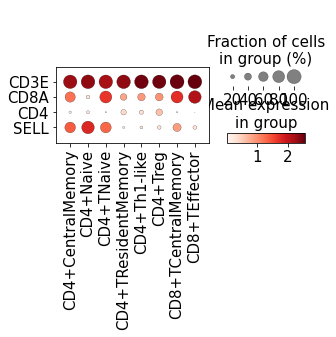

In [114]:
marker_genes = ['CD3E', 'CD8A','CD4', 'SELL']

rcParams['font.size']=18
sc.pl.dotplot(adata_s, marker_genes, groupby='FinalAnnotation', use_raw=False, swap_axes = True)

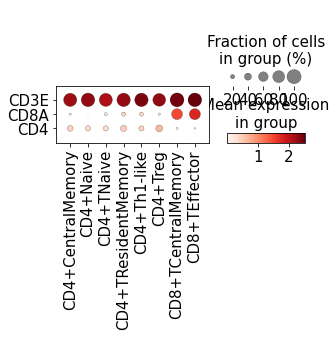

In [112]:
adata_CD4 = adata_high[adata_high.obs.SecondAnnotation == 'CD4+']
sc.pl.dotplot(adata_CD4, marker_genes, 
              groupby='FinalAnnotation', use_raw=False, swap_axes = True)

In [113]:
adata_CD4.obs.groupby(['FinalAnnotation']).size()

FinalAnnotation
CD4+CentralMemory      27239
CD4+Naive              20593
CD4+TNaive              5073
CD4+TResidentMemory     6468
CD4+Th1-like            2510
CD4+Treg                2635
CD8+TCentralMemory      6510
CD8+TEffector          14992
dtype: int64

In [115]:
adata_s.obs.groupby('FinalAnnotation').size()

FinalAnnotation
CD4+CentralMemory       1858
CD4+Naive                300
CD4+TNaive               633
CD4+TResidentMemory     2843
CD4+Th1-like             814
CD4+Treg                 116
CD8+TCentralMemory      5156
CD8+TEffector          11547
dtype: int64

In [20]:
src_meta

,batch,patientID,tissue,stage,majorCluster,subCluster,clonal_TCR,clone.seq_TCR,clonal_BCR,clone.seq_BCR
index,,,,,,,,,,
AAACCTGAGACTACAA-1-P190808_Blood_2,P190808_Blood_2,P190808,Blood,IT,CD4_T,CD4T_c01-LEF1,False,P190808_TRAV8-4_TGTGCTGTGGGGGATACTGGAGGCTTCAAA...,NaN,NaN
AAACCTGAGAGTACCG-1-P190808_Blood_2,P190808_Blood_2,P190808,Blood,IT,NK,NK_c02-KLRC2,NaN,NaN,NaN,NaN
AAACCTGGTATATGGA-1-P190808_Blood_2,P190808_Blood_2,P190808,Blood,IT,gd_T,gd1T-c03-CXCR3,True,P190808_TRAV21_TGTGCTGTGATGTTGGGTTCTGCAAGGCAAC...,NaN,NaN
AAACGGGAGACAAGCC-1-P190808_Blood_2,P190808_Blood_2,P190808,Blood,IT,CD4_T,CD4T_c01-LEF1,NaN,NaN,NaN,NaN
AAACGGGAGCGCCTCA-1-P190808_Blood_2,P190808_Blood_2,P190808,Blood,IT,CD8_T,CD8T_c03-CX3CR1,True,P190808_TRAV20_TGTGCTGTGGGGATTCTTATAATGAATTCTG...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCGGCGGTT-1-P191112_Blood_1,P191112_Blood_1,P191112,Blood,IA,doublet,NaN,False,P191112_TRAV8-2_TGTGTTGTCCATGGCAGGGGGAGAGATGAC...,False,P191112_IGHV3-11_IGHJ6_CDR3clone_69_10
TTTGTCATCGTCACGG-1-P191112_Blood_1,P191112_Blood_1,P191112,Blood,IA,Myeloid,mono_c01-CD14,NaN,NaN,NaN,NaN
TTTGTCATCTATCCCG-1-P191112_Blood_1,P191112_Blood_1,P191112,Blood,IA,Myeloid,mono_c02-FCGR3A,NaN,NaN,NaN,NaN
